In [1]:
%load_ext lab_black

In [2]:
import os
import random
import warnings
import numpy as np
import pandas as pd
import geopandas as gpd
import planetary_computer
import matplotlib.pyplot as plt
from pyhere import here
from itertools import product
from collections import OrderedDict
from shapely import geometry
from shapely.geometry import Polygon, mapping

import tifffile
import rasterio
import stackstac
import rioxarray
import xarray as xr
import skimage.exposure
import xrspatial.multispectral as ms
from xrspatial.focal import mean
from pystac_client import Client
from rasterio import windows, warp, features
from pystac.extensions.eo import EOExtension as eo

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchgeo.models import RCF

from typing import (
    Dict,
    List,
    Tuple,
    Union,
    Callable,
    Any,
    Optional,
    Iterable,
)

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
random.seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

warnings.filterwarnings(action="ignore", category=UserWarning, module="stackstac")

In [3]:
def create_square_buffer(
    aoi: Dict[str, Any],
    buffer_distance_m: float = 500,
    input_crs: str = "EPSG:4326",
    crs_transform: str = "ESRI:54009",
) -> Dict[str, Any]:
    """
    Create a square buffer around the centroid of the given area of interest (AOI)
    after projecting it to a specified equal area projection. This process ensures
    that the buffer size is accurate in meters.

    Parameters
    ----------
    aoi : Dict[str, Any]
        The area of interest in GeoJSON format.
    buffer_distance_m : float, default 500
        The distance in meters for the square buffer.
    input_crs : str, default "EPSG:4326"
        The coordinate reference system of the input AOI.
    crs_transform : str, default "ESRI:54009"
        The equal area projection CRS used for accurate buffer calculation.

    Returns
    -------
    Dict[str, Any]
        A GeoJSON object containing the square buffer in the original CRS
        (specified by `input_crs`).

    Note
    ----
    The function projects the AOI to the specified equal area projection
    (given by `crs_transform`), calculates the centroid, creates a square
    buffer around it, and then reprojects the buffer back to the original CRS.
    """

    # Create a GeoDataFrame from the AOI
    gdf = gpd.GeoDataFrame(
        [aoi], geometry=[Polygon(aoi["coordinates"][0])], crs=input_crs
    )

    # Project the AOI to an equal area projection
    gdf_projected = gdf.to_crs(crs_transform)

    # Calculate the centroid in the projected CRS
    centroid = gdf_projected.geometry.centroid.iloc[0]

    # Create a square buffer around the centroid in meters
    buffer_projected = centroid.buffer(buffer_distance_m).envelope

    # Create a geoseries of the buffered geometry
    buffer_geoseries = gpd.GeoSeries([buffer_projected], crs=crs_transform)

    # Reproject the buffer back to the original CRS
    buffer_geojson = buffer_geoseries.to_crs(input_crs).__geo_interface__

    return buffer_geojson["features"][0]["geometry"]


def get_least_cloudy_image(
    catalog: Client,
    aoi: geometry.mapping,
    datetime: str,
    bands: list[str] = ["B02", "B03", "B04", "B08"],
):
    """
    Retrieves and stacks specified bands of the least cloudy Sentinel-2 image
    of a given area of interest (AOI) and time period.

    Parameters
    ----------
    catalog : Client
        The STAC catalog client used for searching imagery.
    aoi : geometry.mapping
        The area of interest in GeoJSON format.
    datetime : str
        The time period for the search in 'YYYY-MM-DD/YYYY-MM-DD' format.
    bands : list[str], optional
        List of band names to retrieve and stack.
    """
    search = catalog.search(
        collections=["sentinel-2-l2a"],
        intersects=aoi,
        datetime=datetime,
        query={"eo:cloud_cover": {"lt": 10}},
    )

    coordinates = aoi["coordinates"][0]

    # Initialize min and max values with the first coordinate
    min_x, min_y = coordinates[0]
    max_x, max_y = coordinates[0]

    # Iterate through coordinates to find min and max values
    for x, y in coordinates:
        min_x = min(min_x, x)
        min_y = min(min_y, y)
        max_x = max(max_x, x)
        max_y = max(max_y, y)

    aoi_bounds = (min_x, min_y, max_x, max_y)

    # Check how many items were returned
    items = search.item_collection()

    if len(items) == 0:
        print("\tNo items found for the given AOI and time period.")
        return None

    print(f"\tSearch returned {len(items)} items")

    # Select the least cloudy item
    least_cloudy_item = min(items, key=lambda item: eo.ext(item).cloud_cover)

    print(
        (
            f"\tChoosing {least_cloudy_item.id} "
            f"from {least_cloudy_item.datetime.date()} "
            f"with {eo.ext(least_cloudy_item).cloud_cover}% cloud cover"
        )
    )

    stack = stackstac.stack(
        least_cloudy_item,
        assets=["B02", "B03", "B04", "B08"],
        epsg=4326,
        bounds_latlon=aoi_bounds,
    )

    return stack


class TIFImageDataset(Dataset):
    """
    A PyTorch Dataset for reading .tif images with 4 color channels.

    Parameters
    ----------
    image_dir : str
        Directory where the .tif images are stored.
    transform : callable, optional
        Optional transform to be applied on a sample.

    Attributes
    ----------
    image_paths : list
        List of image file paths in the directory.
    transform : callable
        Transform to be applied on a sample.
    """

    def __init__(self, image_dir: str, transform=None):
        """
        Initialize the dataset with the directory of images and transforms.
        """
        self.image_paths = [
            os.path.join(image_dir, fname)
            for fname in os.listdir(image_dir)
            if fname.endswith(".tif")
        ]
        self.transform = transform

    def __len__(self) -> int:
        """
        Return the number of images in the dataset.
        """
        return len(self.image_paths)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, str]:
        """
        Get an image by the index and apply min-max normalization.

        Parameters
        ----------
        idx : int
            Index of the image to retrieve.

        Returns
        -------
        Tuple[torch.Tensor, str]
            A tuple of the normalized image tensor and the image name without extension.
        """
        image_path = self.image_paths[idx]
        image = tifffile.imread(image_path)

        # Applying min-max normalization
        image = image.astype(np.float32)
        min_val = image.min()
        max_val = image.max()
        image = (image - min_val) / (max_val - min_val)

        image = torch.from_numpy(image).permute(2, 0, 1)  # Change HWC to CHW

        if self.transform:
            image = self.transform(image)

        image_name = os.path.splitext(os.path.basename(image_path))[
            0
        ]  # Extract file name without extension

        return image, image_name


class RCF(nn.Module):
    """
    A model for extracting Random Convolution Features (RCF) from input imagery.

    Parameters
    ----------
    num_features : int
        Number of features to extract.
    kernel_size : int
        Size of the convolutional kernel.
    num_input_channels : int
        Number of input channels.
    """

    def __init__(self, num_features=16, kernel_size=3, num_input_channels=4):
        super(RCF, self).__init__()
        assert num_features % 2 == 0, "Please enter an even number of features."
        self.num_features = num_features
        self.conv1 = nn.Conv2d(
            num_input_channels,
            num_features // 2,
            kernel_size=kernel_size,
            stride=1,
            padding=0,
            dilation=1,
            bias=True,
        )
        nn.init.normal_(self.conv1.weight, mean=0.0, std=1.0)
        nn.init.constant_(self.conv1.bias, -1.0)

    def forward(self, x, weights=None, return_activation_map=False, feature_index=None):
        """
        Forward pass of the RCF model.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor.
        weights : torch.Tensor, optional
            Array of weights to be applied to the activation layers.
        return_activation_map : bool, optional
            Flag to return activation map.
        feature_index : int, optional
            Index of the feature to return the activation map for.

        Returns
        -------
        torch.Tensor
            Output tensor, activation map, or weighted sum of activation maps.
        """
        x1a = F.relu(self.conv1(x), inplace=True)
        x1b = F.relu(-self.conv1(x), inplace=True)

        if return_activation_map and feature_index is not None:
            if feature_index < self.num_features // 2:
                return x1a[:, feature_index, :, :]
            elif feature_index < self.num_features:
                return x1b[:, feature_index - self.num_features // 2, :, :]
            else:
                raise ValueError(
                    f"Feature index {feature_index} is out of bounds for the number of features {self.num_features}"
                )

        if weights is not None:
            if weights.shape[0] != self.num_features:
                raise ValueError(
                    f"Length of weights {weights.shape[0]} does not match number of features {self.num_features}"
                )
            # Apply weights to the activation maps
            x1a *= weights[: self.num_features // 2].unsqueeze(-1).unsqueeze(-1)
            x1b *= weights[self.num_features // 2 :].unsqueeze(-1).unsqueeze(-1)

            # Sum across the maps for pixel-level predictions
            return x1a.sum(dim=1) + x1b.sum(dim=1)

        # Default behavior when weights are not provided
        x1a = F.adaptive_avg_pool2d(x1a, (1, 1)).squeeze()
        x1b = F.adaptive_avg_pool2d(x1b, (1, 1)).squeeze()

        if len(x1a.shape) == 1:
            return torch.cat((x1a, x1b), dim=0)
        elif len(x1a.shape) == 2:
            return torch.cat((x1a, x1b), dim=1)


def custom_sort(key, low_name):
    location, year = key.split("_")
    # Priority to location: low_name first, then high_name,
    # sorted by year within each location
    return (location != low_name, int(year))

In [4]:
######################################## LOW ########################################
# # Kalabo
# low_name = "Kalabo"
# aoi_low = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [22.827762962071233, -15.390883445953165],
#             [22.827762962071233, -15.41575813166753],
#             [22.86088208179777, -15.41575813166753],
#             [22.86088208179777, -15.390883445953165],
#             [22.827762962071233, -15.390883445953165],
#         ]
#     ],
# }

# # Kalabo
# low_name = "Kalabo"
# aoi_low = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [22.660594647130864, -15.001215280252694],
#             [22.660594647130864, -15.030789870446],
#             [22.695313570853216, -15.030789870446],
#             [22.695313570853216, -15.001215280252694],
#             [22.660594647130864, -15.001215280252694],
#         ]
#     ],
# }


# # Livingstone
# low_name = "Livingstone"
# aoi_low = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [25.96893050624419, -17.593696044391933],
#             [25.96893050624419, -17.621210436237163],
#             [26.000546483299246, -17.621210436237163],
#             [26.000546483299246, -17.593696044391933],
#             [25.96893050624419, -17.593696044391933],
#         ]
#     ],
# }

# # Kazungula
# low_name = "Kazungula"
# aoi_low = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [25.977774470528374, -17.01911729247948],
#             [25.977774470528374, -17.044418119062968],
#             [26.011219573795017, -17.044418119062968],
#             [26.011219573795017, -17.01911729247948],
#             [25.977774470528374, -17.01911729247948],
#         ]
#     ],
# }

# # Kazungula
# low_name = "Kazungula"
# aoi_low = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [25.85652331382144, -16.891347772977042],
#             [25.85652331382144, -16.917861540631023],
#             [25.886228083696977, -16.917861540631023],
#             [25.886228083696977, -16.891347772977042],
#             [25.85652331382144, -16.891347772977042],
#         ]
#     ],
# }

# # Mumbwa
# low_name = "Mumbwa"
# aoi_low = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [27.403931804272247, -15.07514653424866],
#             [27.403931804272247, -15.10343265403148],
#             [27.435460756446275, -15.10343265403148],
#             [27.435460756446275, -15.07514653424866],
#             [27.403931804272247, -15.07514653424866],
#         ]
#     ],
# }


# # Kalomo
# low_name = "Kalomo"
# aoi_low = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [27.403931804272247, -15.07514653424866],
#             [27.403931804272247, -15.10343265403148],
#             [27.435460756446275, -15.10343265403148],
#             [27.435460756446275, -15.07514653424866],
#             [27.403931804272247, -15.07514653424866],
#         ]
#     ],
# }

# Monze
low_name = "Monze"
aoi_low = {
    "type": "Polygon",
    "coordinates": [
        [
            [27.001502460156246, -16.300396020637677],
            [27.001502460156246, -16.329202143570384],
            [27.035269035452046, -16.329202143570384],
            [27.035269035452046, -16.300396020637677],
            [27.001502460156246, -16.300396020637677],
        ]
    ],
}


# # Senanga
# low_name = "Senanga"
# aoi_low = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [23.32715463336453, -15.852247420589904],
#             [23.32715463336453, -15.871975378824203],
#             [23.346929045674614, -15.871975378824203],
#             [23.346929045674614, -15.852247420589904],
#             [23.32715463336453, -15.852247420589904],
#         ]
#     ],
# }

######################################## HIGH ########################################

# # Mkushi
# high_name = "Mkushi"
# aoi_high = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [28.720318215754617, -13.76533277929849],
#             [28.720318215754617, -13.793236443104377],
#             [28.75208238780084, -13.793236443104377],
#             [28.75208238780084, -13.76533277929849],
#             [28.720318215754617, -13.76533277929849],
#         ]
#     ],
# }

# # Kasama
# high_name = "Kasama"
# aoi_high = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [31.254697011426885, -10.184796205656724],
#             [31.254697011426885, -10.154693099206483],
#             [31.221695470297902, -10.154693099206483],
#             [31.221695470297902, -10.184796205656724],
#             [31.254697011426885, -10.184796205656724],
#         ]
#     ],
# }

# # # Chingolo
# high_name = "Chingola"
# aoi_high = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [27.746418976971484, -12.505683981958668],
#             [27.746418976971484, -12.534576530626865],
#             [27.776577731131198, -12.534576530626865],
#             [27.776577731131198, -12.505683981958668],
#             [27.746418976971484, -12.505683981958668],
#         ]
#     ],
# }

# # Mufulira
# high_name = "Mufulira"
# aoi_high = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [28.077400069673956, -12.536734636784558],
#             [28.077400069673956, -12.561245669153664],
#             [28.107320965959786, -12.561245669153664],
#             [28.107320965959786, -12.536734636784558],
#             [28.077400069673956, -12.536734636784558],
#         ]
#     ],
# }

# Kafue
high_name = "Kafue"
aoi_high = {
    "type": "Polygon",
    "coordinates": [
        [
            [28.16218371389141, -15.415496265920439],
            [28.16218371389141, -15.441291610595684],
            [28.18970552087299, -15.441291610595684],
            [28.18970552087299, -15.415496265920439],
            [28.16218371389141, -15.415496265920439],
        ]
    ],
}

# # Mpongwe
# high_name = "Mpongwe"
# aoi_high = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [28.502298469316457, -13.689085835884114],
#             [28.502298469316457, -13.699339457548035],
#             [28.51353665835518, -13.699339457548035],
#             [28.51353665835518, -13.689085835884114],
#             [28.502298469316457, -13.689085835884114],
#         ]
#     ],
# }

# # Mpongwe
# high_name = "Mpongwe"
# aoi_high = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [28.502298469316457, -13.689085835884114],
#             [28.502298469316457, -13.699339457548035],
#             [28.51353665835518, -13.699339457548035],
#             [28.51353665835518, -13.689085835884114],
#             [28.502298469316457, -13.689085835884114],
#         ]
#     ],
# }

# # Choma
# high_name = "Choma"
# aoi_high = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [26.960447835925066, -16.456184900757975],
#             [26.960447835925066, -16.48099073762525],
#             [26.98840704565481, -16.48099073762525],
#             [26.98840704565481, -16.456184900757975],
#             [26.960447835925066, -16.456184900757975],
#         ]
#     ],
# }

# # Choma
# high_name = "Choma"
# aoi_high = {
#     "type": "Polygon",
#     "coordinates": [
#         [
#             [26.83551399374639, -17.232328092455177],
#             [26.83551399374639, -17.267951448580163],
#             [26.872507759879, -17.267951448580163],
#             [26.872507759879, -17.232328092455177],
#             [26.83551399374639, -17.232328092455177],
#         ]
#     ],
# }

# Choma
high_name = "Choma"
aoi_high = {
    "type": "Polygon",
    "coordinates": [
        [
            [26.960619378725198, -16.455571314581817],
            [26.960619378725198, -16.47700857109605],
            [26.982374680532985, -16.47700857109605],
            [26.982374680532985, -16.455571314581817],
            [26.960619378725198, -16.455571314581817],
        ]
    ],
}

## Get Sentinel 2 Imagery

In [5]:
catalog = Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

geodetic = "EPSG:4326"
mollweide = "ESRI:54009"

n_km = 5

buffer = int(np.sqrt(1_000**2 * n_km) / 2)

month = 5


year_2019 = f"2019-0{month}-01/2019-0{month}-30"
year_2021 = f"2021-0{month}-01/2021-0{month}-30"

aoi_low = create_square_buffer(aoi_low, buffer)

aoi_high = create_square_buffer(aoi_high, buffer)

aois = {low_name: aoi_low, high_name: aoi_high}
years = {"2019": year_2019, "2021": year_2021}

images = []

for name, aoi in aois.items():
    for year, date in years.items():
        print(f"Processing {name} for {year}")
        image = get_least_cloudy_image(catalog, aoi, date)
        if image is not None:
            images.append(image)
            img_fp = here("data", "sample_images")
            img_fn = f"{name}_{year}.tif"
            print(f"\tSaving image as {img_fn}")
            image = image.squeeze()
            image_path = here(img_fp, img_fn)
            image.rio.to_raster(image_path, driver="COG")

Processing Monze for 2019
	Search returned 17 items
	Choosing S2B_MSIL2A_20190523T080619_R078_T35LMC_20201006T173024 from 2019-05-23 with 0.000461% cloud cover
	Saving image as Monze_2019.tif
Processing Monze for 2021
	Search returned 17 items
	Choosing S2A_MSIL2A_20210507T080611_R078_T35LMC_20210524T040617 from 2021-05-07 with 0.000537% cloud cover
	Saving image as Monze_2021.tif
Processing Choma for 2019
	Search returned 4 items
	Choosing S2B_MSIL2A_20190523T080619_R078_T35KMB_20201006T173024 from 2019-05-23 with 0.000946% cloud cover
	Saving image as Choma_2019.tif
Processing Choma for 2021
	Search returned 4 items
	Choosing S2B_MSIL2A_20210522T080609_R078_T35KMB_20210605T204753 from 2021-05-22 with 0.001423% cloud cover
	Saving image as Choma_2021.tif


## Set Plotting Parameters

In [6]:
img_fp = here("data", "sample_images")
dataset = TIFImageDataset(img_fp)

yield_fp = here("data", "crop_yield", "cfs_maize_districts_zambia_2009_2022.csv")
yields = pd.read_csv(yield_fp)

low_low = yields.loc[
    (yields.district == low_name) & (yields.year == 2019)
].yield_mt.values[0]
low_high = yields.loc[
    (yields.district == low_name) & (yields.year == 2021)
].yield_mt.values[0]
high_low = yields.loc[
    (yields.district == high_name) & (yields.year == 2019)
].yield_mt.values[0]
high_high = yields.loc[
    (yields.district == high_name) & (yields.year == 2021)
].yield_mt.values[0]

titles = [
    f"(1) {low_name} - 2019 - ({round(low_low, 2)} mt/ha)",
    f"(2) {low_name} - 2021 - ({round(low_high, 2)} mt/ha)",
    f"(3) {high_name} - 2019 - ({round(high_low, 2)} mt/ha)",
    f"(4) {high_name} - 2021 - ({round(high_high, 2)} mt/ha)",
]

y_labels = [
    None,
    None,
    None,
    None,
]

acceptable_names = [
    f"{low_name}_2019",
    f"{low_name}_2021",
    f"{high_name}_2019",
    f"{high_name}_2021",
]

In [7]:
yields = yields[["year", "district", "yield_mt"]]
yields_summary = yields.groupby("district")["yield_mt"].agg(
    ["min", "max", "mean"]
)  # .reset_index()
# yields_summary

In [8]:
yield_diff = (
    yields[yields["year"].isin([2019, 2021])]
    .pivot(index="district", columns="year", values="yield_mt")
    .reset_index()
    .rename_axis(None, axis=1)
)
yield_diff["diff_21-19"] = yield_diff[2021] - yield_diff[2019]
yield_diff = yield_diff[["district", "diff_21-19"]]
yield_diff = yield_diff.set_index("district")
yield_diff = yield_diff.join(yields_summary).reset_index()
yield_diff = yield_diff.sort_values(by="mean", ascending=False)

yield_diff["rank"] = yield_diff["mean"].rank(ascending=False)
yield_diff["rank"] = yield_diff["rank"].astype(int)
# yield_diff.sort_values(by="diff_21-19", ascending=False).head(30)

In [9]:
sorted(yield_diff.district.unique())  # "Mpongwe" "Chipata" "Chibombo" "Chipata"
yield_diff[yield_diff.district.isin(["Choma"])]

,district,diff_21-19,min,max,mean,rank
10,Choma,1.598437,0.138716,6.346956,1.896331,52


## Plot Imagery (RGB)

In [10]:
# for i, image in enumerate(images):
#     img = image.sel(band=["B04", "B03", "B02"]).compute()
#     img = xr.apply_ufunc(skimage.exposure.rescale_intensity, img)
#     fig = plt.figure(frameon=False)
#     ax = plt.Axes(fig, [0.0, 0.0, 1.0, 1.0])
#     ax.set_axis_off()
#     fig.add_axes(ax)
#     plt.imshow(img.isel(time=0).transpose("y", "x", "band"))
#     plt.show()

In [11]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = RCF(num_features=4000, kernel_size=4, num_input_channels=4).eval().to(device)
# image, image_path = dataset[0]
# tensor = model(image)
# feature_to_act = tensor.argmax()
# # feature_to_act = 10

# act_map = {}

# for image, image_path in dataset:
#     if image_path not in acceptable_names:
#         continue
#     print(image_path)
#     activation_map = model(
#         image.unsqueeze(0),
#         return_activation_map=True,
#         feature_index=feature_to_act,
#     )
#     activation_map = activation_map.cpu().detach().numpy()[0]
#     act_map.update({image_path: activation_map})

# act_map = OrderedDict(
#     sorted(act_map.items(), key=lambda item: custom_sort(item[0], low_name))
# )

# for i, image in enumerate(act_map.items()):
#     fig = plt.figure(frameon=False)
#     ax = plt.Axes(fig, [0.0, 0.0, 1.0, 1.0])
#     ax.set_axis_off()
#     fig.add_axes(ax)
#     plt.imshow(image[1], cmap="inferno")
#     plt.show()

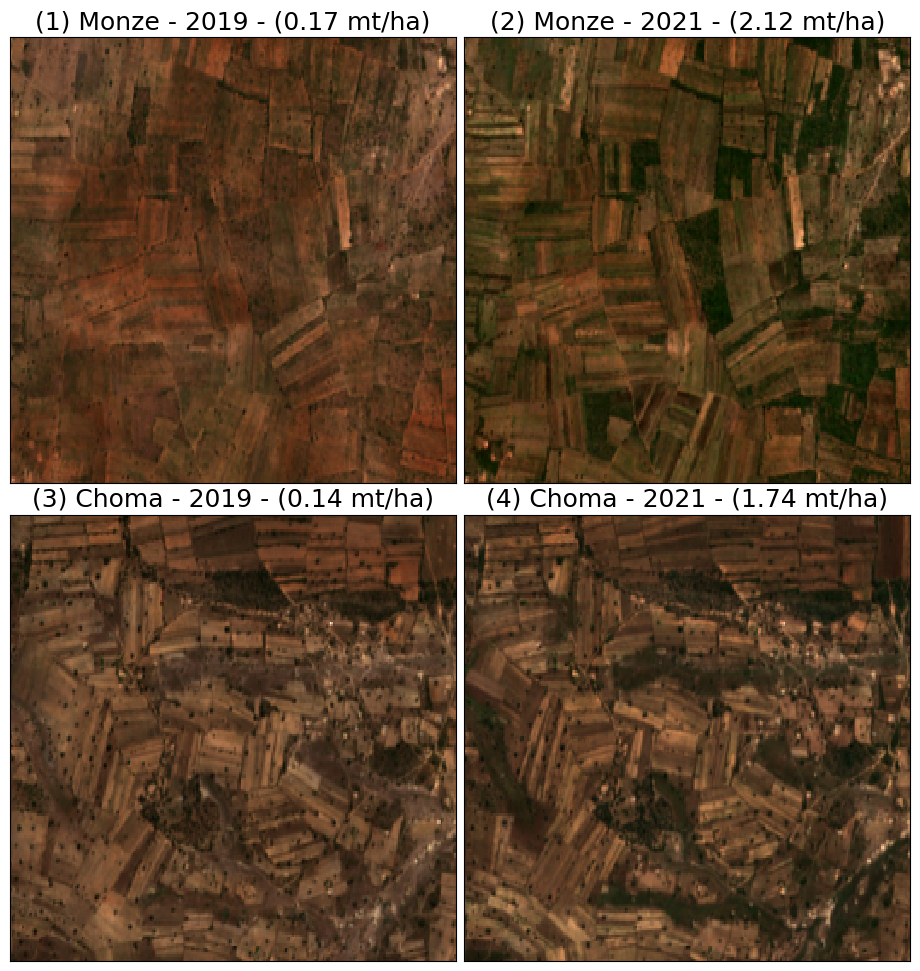

In [12]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

for i, (image) in enumerate(images):
    row = i // 2
    col = i % 2
    img = image.sel(band=["B04", "B03", "B02"]).compute()
    img = xr.apply_ufunc(skimage.exposure.rescale_intensity, img)
    img.isel(time=0).plot.imshow(rgb="band", ax=axs[row, col])
    axs[row, col].set_title(titles[i], fontsize=18)
    axs[row, col].set_ylabel(y_labels[i], fontsize=14)
    axs[row, col].set_xlabel(None)
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])
    axs[row, col].set_xticklabels([])
    axs[row, col].set_yticklabels([])

plt.subplots_adjust(left=0.15, wspace=0.02, hspace=0.07)

plt.show()

## Featurize Imagery (RGB & NIR) 

In [13]:
# import re
# import joblib

# prefix = "f2"
# suffix = str(month)
# pattern = rf"{prefix}_\d{{1,3}}_{suffix}"
# model = joblib.load(here("models", "ridge_model_overall.pkl"))
# feature_names = model.feature_names_
# coefficients = model.coef_
# model_weights = [
#     coef for name, coef in zip(feature_names, coefficients) if re.match(pattern, name)
# ]
# model_weights = torch.tensor(model_weights)
# len(model_weights)

In [14]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = RCF(num_features=1000, kernel_size=4, num_input_channels=4).eval().to(device)
# image, image_path = dataset[12]

# prediction_map = model(
#     image.unsqueeze(0),
#     weights=model_weights,
#     return_activation_map=False,
#     feature_index=None,
# )
# prediction_map = prediction_map.cpu().detach().numpy()[0]
# image_path

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = RCF(num_features=1000, kernel_size=4, num_input_channels=4).eval().to(device)

In [16]:
image, image_path = dataset[0]
tensor = model(image)
top_values, top_indices = torch.topk(tensor, 50)
shuffled_indices = torch.randperm(top_indices.size(0))
feature_to_act = top_indices[shuffled_indices[:1]]

act_map = {}

for image, image_path in dataset:
    if image_path not in acceptable_names:
        continue
    print(image_path)
    activation_map = model(
        image.unsqueeze(0),
        return_activation_map=True,
        feature_index=feature_to_act,
    )
    # activation_map = model(
    #     image.unsqueeze(0),
    #     weights=model_weights,
    #     return_activation_map=False,
    #     feature_index=None,
    # )
    activation_map = activation_map.cpu().detach().numpy()[0]
    act_map.update({image_path: activation_map})

act_map = OrderedDict(
    sorted(act_map.items(), key=lambda item: custom_sort(item[0], low_name))
)

Monze_2021
Choma_2019
Choma_2021
Monze_2019


In [17]:
# features = [12, 21, 850, 999]
features = top_indices[shuffled_indices[:4]]
act_maps = {name: [] for name in acceptable_names}

for image, image_path in dataset:
    if image_path not in acceptable_names:
        continue
    print(f"Processing {image_path}")
    for feature_to_act in features:
        activation_map = model(
            image.unsqueeze(0).to(device),
            return_activation_map=True,
            feature_index=feature_to_act,
        )
        activation_map = activation_map.cpu().detach().numpy()[0]
        act_maps[image_path].append(activation_map)

Processing Monze_2021
Processing Choma_2019
Processing Choma_2021
Processing Monze_2019


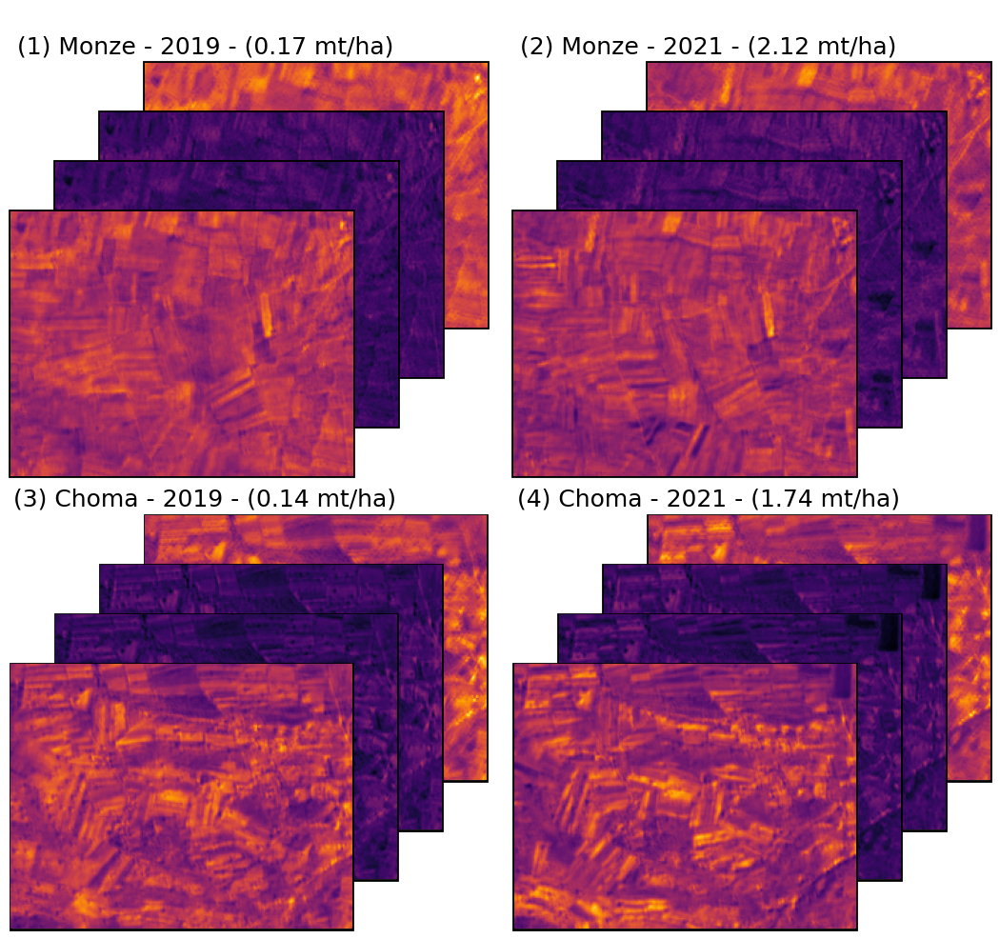

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib


def normalize_activation_maps(act_maps):
    """
    Normalize activation maps to the same range.

    Parameters
    ----------
    act_maps : list
        List of unnormalized activation maps.

    Returns
    -------
    list
        List of normalized activation maps.
    """
    # Find the global minimum and maximum
    global_min = min(map(np.min, act_maps))
    global_max = max(map(np.max, act_maps))

    # Normalize each activation map
    normalized_maps = [
        (map - global_min) / (global_max - global_min) for map in act_maps
    ]
    return normalized_maps


def plot_activation_maps_for_location(
    act_maps,
    ax,
    title=None,
    cmap_name="inferno",
    location_offsets=-np.linspace(0, 0.4, num=4),
):
    """
    Plots stacked activation maps for a single location using a specified colormap and normalization.

    Parameters
    ----------
    act_maps : list
        List of activation maps for the location.
    ax : matplotlib.axes.Axes
        The axes on which to plot the stacked images.
    title : str
        The title to set for this subplot.
    cmap_name : str, optional
        Name of the colormap to use.
    location_offsets : array_like, optional
        Array of offsets for stacking the images.

    Returns
    -------
    None
    """
    cmap = matplotlib.colormaps[cmap_name]  # Use the new API to get the colormap
    normalized_maps = normalize_activation_maps(
        act_maps
    )  # Normalize maps to the same range

    # Iterate over each normalized activation map and its corresponding offset
    for offset, activation_map in zip(location_offsets, normalized_maps):
        # Apply the colormap to the normalized activation map
        colored_activation_map = cmap(activation_map)

        # Create an image box with the colored activation map
        imagebox = OffsetImage(colored_activation_map, zoom=1, alpha=1)

        # Create an annotation box
        ab = AnnotationBbox(
            imagebox,
            (0.5 + offset, 0.5 + offset),
            frameon=True,
            bboxprops=dict(
                edgecolor="black",
                boxstyle="square,pad=0.05",
                linewidth=2,
            ),
            boxcoords="axes fraction",
        )
        # Add the annotation box to the axes
        ax.add_artist(ab)

    # Set the axis limits to make the stacking effect
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis("off")  # Turn off the axis
    ax.set_title(title, fontsize=18, y=0.86, x=0.17)


# Create a 2x2 subplot
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Plot the activation maps for each location
for idx, (location, activation_maps) in enumerate(act_maps.items()):
    i, j = divmod(idx, 2)
    # title = f"Location {idx + 1}: {location}"
    title = titles[idx]
    plot_activation_maps_for_location(activation_maps, axes[i, j], title)

plt.tight_layout()
plt.subplots_adjust(left=0.1, wspace=0.5, hspace=0.22)
plt.show()

## Plot Activation Map

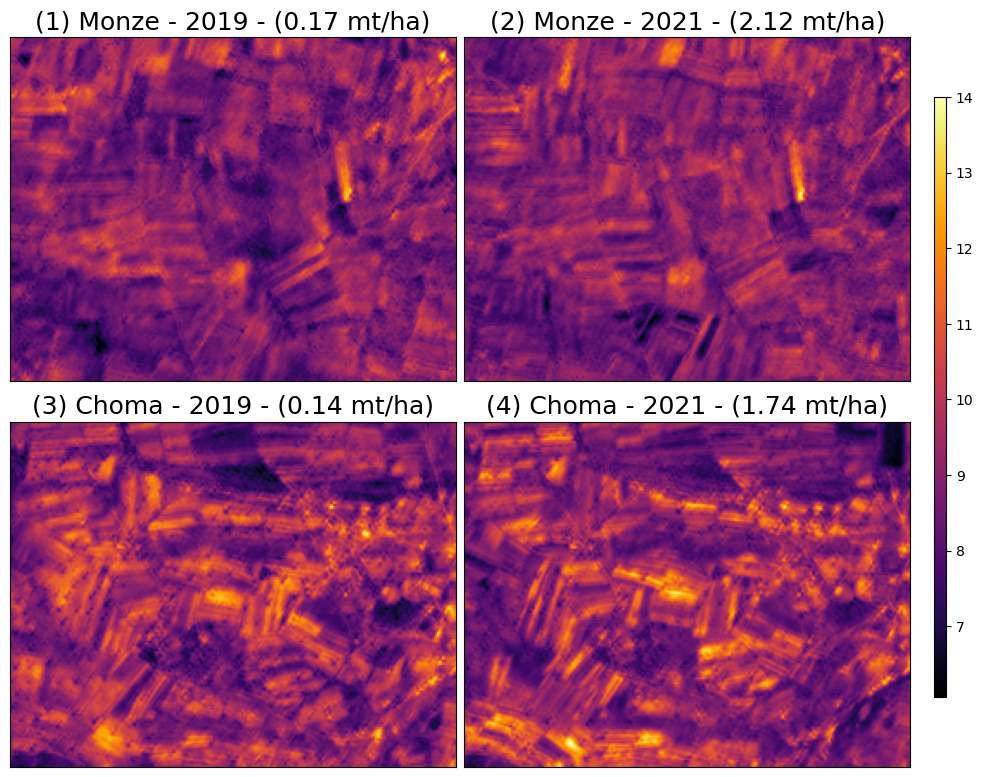

In [19]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

map_images = []

for i, image in enumerate(act_map.items()):
    row = i // 2
    col = i % 2
    im = axs[row, col].imshow(image[1].squeeze(), cmap="inferno")
    map_images.append(im)
    axs[row, col].set_title(titles[i], fontsize=18)
    axs[row, col].set_ylabel(y_labels[i], fontsize=14)
    axs[row, col].set_xlabel(None)
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])

cbar_ax = fig.add_axes([0.92, 0.2, 0.01, 0.6])
fig.colorbar(map_images[0], cax=cbar_ax, orientation="vertical")

plt.subplots_adjust(left=0.15, wspace=0.02, hspace=0.001)
plt.show()

## Plot NDVI $(\frac{NIR-R}{NIR+R})$

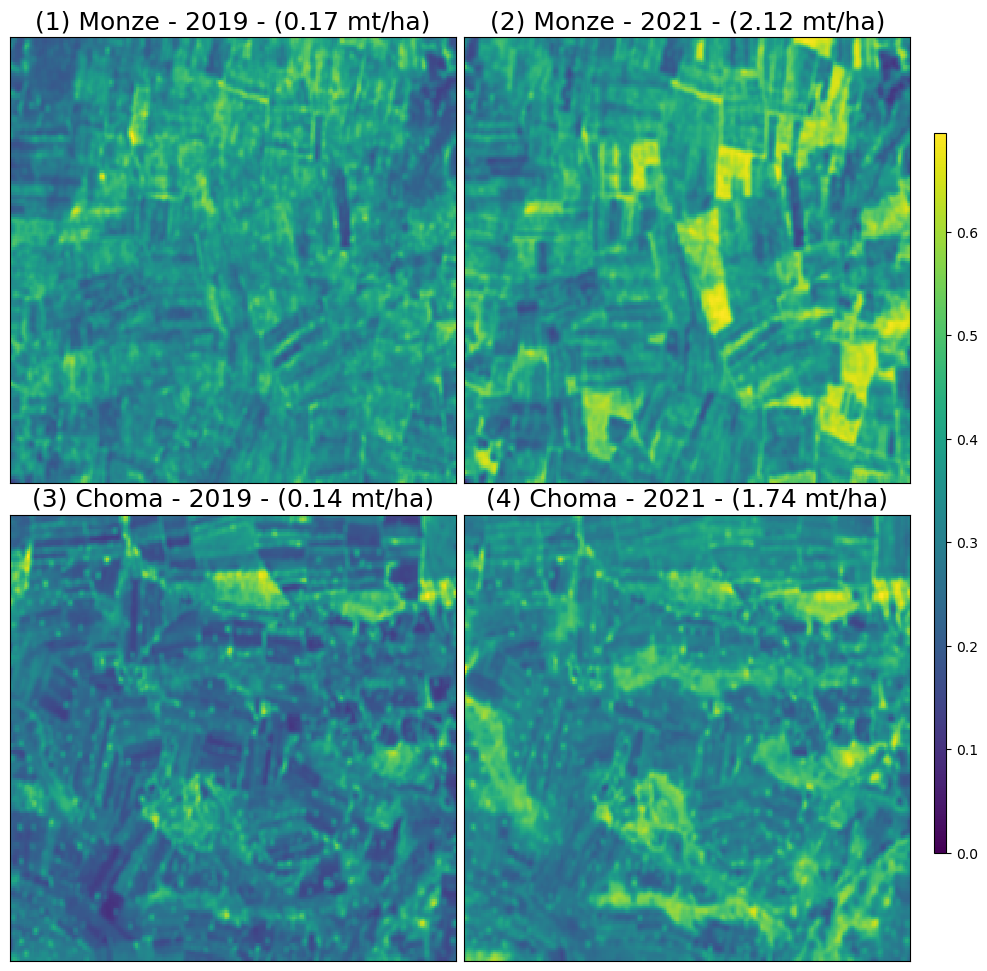

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

ndvi_images = []
for i, (image, y_label) in enumerate(zip(images, y_labels)):
    row = i // 2
    col = i % 2

    x = image.isel(time=0)
    ndvi = ms.ndvi(x.sel(band="B08"), x.sel(band="B04"))
    ndvi.data.compute()
    ndvi = mean(ndvi)

    im = ndvi.plot.imshow(ax=axs[row, col], cmap="viridis", add_colorbar=False, vmin=0)
    ndvi_images.append(im)
    axs[row, col].set_title(titles[i], fontsize=18)
    axs[row, col].set_ylabel(y_label, fontsize=10)
    axs[row, col].set_xlabel(None)
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])

cbar_ax = fig.add_axes([0.92, 0.2, 0.01, 0.6])
fig.colorbar(ndvi_images[0], cax=cbar_ax, orientation="vertical")

plt.subplots_adjust(left=0.15, wspace=0.02, hspace=0.07)
plt.show()

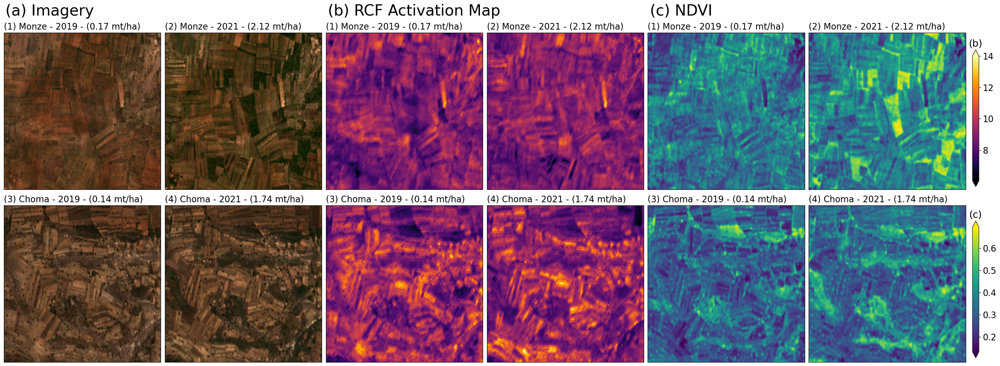

In [21]:
# Function to get subplot axes for a group
def get_group_axes(group_index, axs):
    row_indices = [0, 1]  # Rows for each group
    col_start = group_index * 2
    return [axs[row, col_start + col] for row in row_indices for col in range(2)]


fig, axs = plt.subplots(2, 6, figsize=(33, 11))

# Plotting the imagery in the first group (first 2x2 area)
for i, image in enumerate(images):
    group_axes = get_group_axes(0, axs)
    ax = group_axes[i]

    im = image.sel(band=["B04", "B03", "B02"]).compute()
    im = xr.apply_ufunc(skimage.exposure.rescale_intensity, im)
    im = im.squeeze().transpose("y", "x", "band")
    img_height, img_width = im.shape[:2]
    img = ax.imshow(im, aspect=None)
    ax.set_aspect(img_width / img_height)
    ax.set_title(titles[i], fontsize=16, ha="left", x=0)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_xticks([])
    ax.set_yticks([])

# Plotting the features in the second group (second 2x2 area)
map_images = []
for i, image in enumerate(act_map.items()):
    group_axes = get_group_axes(1, axs)
    ax = group_axes[i]
    im = image[1].squeeze()
    img_height, img_width = im.shape[:2]
    img = ax.imshow(im, cmap="inferno")
    map_images.append(img)
    ax.set_aspect(img_width / img_height)
    ax.set_title(titles[i], fontsize=16, ha="left", x=0)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_xticks([])
    ax.set_yticks([])

# Plotting the NDVI in the third group (third 2x2 area)
ndvi_images = []
for i, image in enumerate(images):
    group_axes = get_group_axes(2, axs)
    ax = group_axes[i]
    im = image.squeeze()
    ndvi = ms.ndvi(im.sel(band="B08"), im.sel(band="B04"))
    ndvi.data.compute()
    ndvi = mean(ndvi)
    img_height, img_width = ndvi.shape[:2]
    img = ax.imshow(ndvi, cmap="viridis")
    ndvi_images.append(img)
    ax.set_aspect(img_width / img_height)
    ax.set_title(titles[i], fontsize=16, ha="left", x=0)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_xticks([])
    ax.set_yticks([])

cbar_ax_features = fig.add_axes([0.905, 0.12, 0.005, 0.32])
cbar = fig.colorbar(
    ndvi_images[0], cax=cbar_ax_features, orientation="vertical", extend="both"
)
cbar.ax.set_title("(c)", fontsize=18)
cbar.ax.tick_params(labelsize=16)

cbar_ax_ndvi = fig.add_axes([0.905, 0.52, 0.005, 0.32])
cbar = fig.colorbar(
    map_images[0], cax=cbar_ax_ndvi, orientation="vertical", extend="both"
)
cbar.ax.set_title("(b)", fontsize=18)
cbar.ax.tick_params(labelsize=16)

block_labels = [
    "(a) Imagery",
    "(b) RCF Activation Map",
    "(c) NDVI",
]

label_positions = [0.186, 0.47, 0.678]

for i, label in enumerate(block_labels):
    fig.text(label_positions[i], 0.93, label, ha="center", va="center", fontsize=28)

plt.subplots_adjust(left=0.15, wspace=0.02, hspace=0.1)
plt.show()

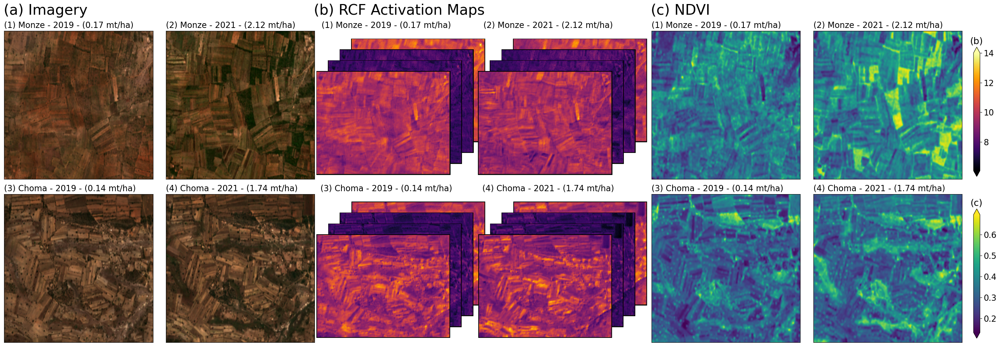

In [22]:
def plot_activation_maps_for_location(
    act_maps,
    ax,
    title=None,
    cmap_name="inferno",
    location_offsets=-np.linspace(0, 0.22, num=4),
    x_adjustment=0.0,  # Additional parameter for x-axis adjustment
    y_adjustment=0.0,
):
    """
    Plots stacked activation maps for a single location using a specified colormap and normalization.


    Parameters
    ----------
    act_maps : list
        List of activation maps for the location.
    ax : matplotlib.axes.Axes
        The axes on which to plot the stacked images.
    title : str
        The title to set for this subplot.
    cmap_name : str, optional
        Name of the colormap to use.
    location_offsets : array_like, optional
        Array of offsets for stacking the images.

    Returns
    -------
    None
    """
    cmap = matplotlib.colormaps[cmap_name]  # Use the new API to get the colormap
    normalized_maps = normalize_activation_maps(
        act_maps
    )  # Normalize maps to the same range

    # Iterate over each normalized activation map and its corresponding offset
    for offset, activation_map in zip(location_offsets, normalized_maps):
        # Apply the colormap to the normalized activation map
        colored_activation_map = cmap(activation_map)

        # Create an image box with the colored activation map
        imagebox = OffsetImage(colored_activation_map, zoom=1, alpha=1)

        # Create an annotation box
        ab = AnnotationBbox(
            imagebox,
            (0.5 + offset + x_adjustment, 0.5 + offset + y_adjustment),
            frameon=True,
            bboxprops=dict(
                edgecolor="black",
                boxstyle="square,pad=0.05",
                linewidth=2,
            ),
            boxcoords="axes fraction",
        )
        # Add the annotation box to the axes
        ax.add_artist(ab)

    # Set the axis limits to make the stacking effect
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis("off")  # Turn off the axis
    ax.set_title(title, fontsize=16, y=1, x=0.4)

    # Function to get subplot axes for a group


def get_group_axes(group_index, axs):
    row_indices = [0, 1]  # Rows for each group
    col_start = group_index * 2
    return [axs[row, col_start + col] for row in row_indices for col in range(2)]


fig, axs = plt.subplots(2, 6, figsize=(35, 11))

# Plotting the imagery in the first group (first 2x2 area)
for i, image in enumerate(images):
    group_axes = get_group_axes(0, axs)
    ax = group_axes[i]

    im = image.sel(band=["B04", "B03", "B02"]).compute()
    im = xr.apply_ufunc(skimage.exposure.rescale_intensity, im)
    im = im.squeeze().transpose("y", "x", "band")
    img_height, img_width = im.shape[:2]
    img = ax.imshow(im, aspect=None)
    ax.set_aspect(img_width / img_height)
    ax.set_title(titles[i], fontsize=16, ha="left", x=0)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_xticks([])
    ax.set_yticks([])

# Plotting the features in the second group (second 2x2 area)
for idx, (location, activation_maps) in enumerate(act_maps.items()):
    group_axes = get_group_axes(1, axs)
    ax = group_axes[idx]
    plot_activation_maps_for_location(
        activation_maps,
        ax,
        titles[idx],
        x_adjustment=0.1,
        y_adjustment=0.1,
    )

# Plotting the NDVI in the third group (third 2x2 area)
ndvi_images = []
for i, image in enumerate(images):
    group_axes = get_group_axes(2, axs)
    ax = group_axes[i]
    im = image.squeeze()
    ndvi = ms.ndvi(im.sel(band="B08"), im.sel(band="B04"))
    ndvi.data.compute()
    ndvi = mean(ndvi)
    img_height, img_width = ndvi.shape[:2]
    img = ax.imshow(ndvi, cmap="viridis")
    ndvi_images.append(img)
    ax.set_aspect(img_width / img_height)
    ax.set_title(titles[i], fontsize=16, ha="left", x=0)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_xticks([])
    ax.set_yticks([])

cbar_ax_features = fig.add_axes([0.905, 0.52, 0.005, 0.32])
cbar = fig.colorbar(
    map_images[0], cax=cbar_ax_features, orientation="vertical", extend="both"
)
cbar.ax.set_title("(b)", fontsize=18)
cbar.ax.tick_params(labelsize=16)

cbar_ax_ndvi = fig.add_axes([0.905, 0.12, 0.005, 0.32])
cbar = fig.colorbar(
    ndvi_images[0], cax=cbar_ax_ndvi, orientation="vertical", extend="both"
)
cbar.ax.set_title("(c)", fontsize=18)
cbar.ax.tick_params(labelsize=16)

block_labels = [
    "(a) Imagery",
    "(b) RCF Activation Maps",
    "(c) NDVI",
]

label_positions = [0.186, 0.46, 0.678]

for i, label in enumerate(block_labels):
    fig.text(label_positions[i], 0.93, label, ha="center", va="center", fontsize=28)

plt.subplots_adjust(left=0.15, wspace=0.02, hspace=0.1)
plt.show()